In [ ]:
!pip install opendatasets

In [ ]:
import opendatasets as od
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [ ]:
od.download("https://www.kaggle.com/datasets/kartik2112/fraud-detection")

Skipping, found downloaded files in "./fraud-detection" (use force=True to force download)


In [ ]:
df=pd.read_csv("/content/fraud-detection/fraudTrain.csv")

In [ ]:
df.head()

,Unnamed: 0,trans_date_trans_time,cc_num,merchant,category,amt,first,last,gender,street,...,lat,long,city_pop,job,dob,trans_num,unix_time,merch_lat,merch_long,is_fraud
0,0,2019-01-01 00:00:18,2703186189652095,"fraud_Rippin, Kub and Mann",misc_net,4.97,Jennifer,Banks,F,561 Perry Cove,...,36.0788,-81.1781,3495,"Psychologist, counselling",1988-03-09,0b242abb623afc578575680df30655b9,1325376018,36.011293,-82.048315,0
1,1,2019-01-01 00:00:44,630423337322,"fraud_Heller, Gutmann and Zieme",grocery_pos,107.23,Stephanie,Gill,F,43039 Riley Greens Suite 393,...,48.8878,-118.2105,149,Special educational needs teacher,1978-06-21,1f76529f8574734946361c461b024d99,1325376044,49.159047,-118.186462,0
2,2,2019-01-01 00:00:51,38859492057661,fraud_Lind-Buckridge,entertainment,220.11,Edward,Sanchez,M,594 White Dale Suite 530,...,42.1808,-112.2620,4154,Nature conservation officer,1962-01-19,a1a22d70485983eac12b5b88dad1cf95,1325376051,43.150704,-112.154481,0
3,3,2019-01-01 00:01:16,3534093764340240,"fraud_Kutch, Hermiston and Farrell",gas_transport,45.00,Jeremy,White,M,9443 Cynthia Court Apt. 038,...,46.2306,-112.1138,1939,Patent attorney,1967-01-12,6b849c168bdad6f867558c3793159a81,1325376076,47.034331,-112.561071,0
4,4,2019-01-01 00:03:06,375534208663984,fraud_Keeling-Crist,misc_pos,41.96,Tyler,Garcia,M,408 Bradley Rest,...,38.4207,-79.4629,99,Dance movement psychotherapist,1986-03-28,a41d7549acf90789359a9aa5346dcb46,1325376186,38.674999,-78.632459,0


In [ ]:
is_fraud_count=0
not_fraud_count=0
for i in df['is_fraud']:
  if i==1:
    is_fraud_count+=1
  else:
    not_fraud_count+=1

In [ ]:
print("Fraud Count:",is_fraud_count)
print("Non Fraud Count:",not_fraud_count)

Fraud Count: 7506
Non Fraud Count: 1289169


In [ ]:
import plotly.express as px


df['fraud_status'] = df['is_fraud'].astype(str).map({'1': 'fraud', '0': 'not fraud'})

fig = px.pie(df,
             names='fraud_status',
             title='Fraud Detection')
fig.show()

In [ ]:
df['hour']=pd.to_datetime(df['trans_date_trans_time']).dt.hour
df['hour']

,hour
0,0
1,0
2,0
3,0
4,0
...,...
1296670,12
1296671,12
1296672,12
1296673,12


In [ ]:
df.columns

Index(['Unnamed: 0', 'trans_date_trans_time', 'cc_num', 'merchant', 'category',
       'amt', 'first', 'last', 'gender', 'street', 'city', 'state', 'zip',
       'lat', 'long', 'city_pop', 'job', 'dob', 'trans_num', 'unix_time',
       'merch_lat', 'merch_long', 'is_fraud', 'fraud_status', 'hour'],
      dtype='object')

In [ ]:
fraud_hour_count=df.loc[df['is_fraud']==1]
fraud_hour_count.value_counts('hour')

,count
hour,
22,1931
23,1904
1,658
0,635
2,625
3,609
14,86
19,81
18,81


In [ ]:
df.isnull().sum()

,0
Unnamed: 0,0
trans_date_trans_time,0
cc_num,0
merchant,0
category,0
amt,0
first,0
last,0
gender,0
street,0


In [ ]:
df.drop(['city','job','Unnamed: 0','merchant','trans_date_trans_time', 'cc_num', 'first', 'last', 'street','state', 'zip', 'trans_num', 'unix_time','fraud_status', 'dob','lat',	'long','merch_lat','merch_long'],axis=1,inplace=True)
df.head(5)

,category,amt,gender,city_pop,is_fraud,hour
0,misc_net,4.97,F,3495,0,0
1,grocery_pos,107.23,F,149,0,0
2,entertainment,220.11,M,4154,0,0
3,gas_transport,45.00,M,1939,0,0
4,misc_pos,41.96,M,99,0,0


In [ ]:
df.drop_duplicates(inplace=True)

In [ ]:
df.reset_index(drop=True,inplace=True)

In [ ]:
from sklearn.preprocessing import LabelEncoder
le=LabelEncoder()
df['category']=le.fit_transform(df['category'])
df['gender']=le.fit_transform(df['gender'])

In [ ]:
df.head()

,category,amt,gender,city_pop,is_fraud,hour
0,8,4.97,0,3495,0,0
1,4,107.23,0,149,0,0
2,0,220.11,1,4154,0,0
3,2,45.00,1,1939,0,0
4,9,41.96,1,99,0,0


In [ ]:
df.columns

Index(['category', 'amt', 'gender', 'city_pop', 'is_fraud', 'hour'], dtype='object')

In [ ]:
test_df=pd.read_csv("/content/fraud-detection/fraudTest.csv")
test_df['hour']=pd.to_datetime(test_df['trans_date_trans_time']).dt.hour
test_df.drop(['city','job','Unnamed: 0','merchant','trans_date_trans_time', 'cc_num', 'first', 'last', 'street','state', 'zip', 'trans_num', 'unix_time','dob','lat',	'long','merch_lat','merch_long'],axis=1,inplace=True)
from sklearn.preprocessing import LabelEncoder
le=LabelEncoder()
test_df['category']=le.fit_transform(test_df['category'])
test_df['gender']=le.fit_transform(test_df['gender'])

test_df.head()
x_test=test_df.drop('is_fraud',axis=1)
y_test=test_df['is_fraud']



In [ ]:
test_df.head(5)

,category,amt,gender,city_pop,is_fraud,hour
0,10,2.86,1,333497,0,12
1,10,29.84,0,302,0,12
2,5,41.28,0,34496,0,12
3,9,60.05,1,54767,0,12
4,13,3.19,1,1126,0,12


In [ ]:
x=df.drop('is_fraud',axis=1)
y=df['is_fraud']

Random undersamppling

SMOTE



In [ ]:
y.value_counts()

,count
is_fraud,
0,1287047
1,7506


In [ ]:
from imblearn.under_sampling import RandomUnderSampler
rus = RandomUnderSampler(random_state=42)
x_resampled, y_resampled = rus.fit_resample(x, y)
y_resampled.value_counts()

,count
is_fraud,
0,7506
1,7506


In [ ]:
from imblearn.over_sampling import SMOTE
smote = SMOTE(random_state=42)
x_smote, y_smote = smote.fit_resample(x, y)
y_smote.value_counts()

,count
is_fraud,
0,1287047
1,1287047


In [ ]:
from sklearn.linear_model import LogisticRegression
lr=LogisticRegression()
lr.fit(x_smote, y_smote)
y_pred=lr.predict(x_test)
y_pred

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



array([0, 0, 0, ..., 0, 0, 0])

In [ ]:
import sklearn.metrics as accuracyscore
accuracy=accuracyscore.accuracy_score(y_test,y_pred)
accuracy

0.8937268655561533

In [ ]:
import sklearn.metrics as classification_report
print(classification_report.classification_report(y_test,y_pred))

              precision    recall  f1-score   support

           0       1.00      0.89      0.94    553574
           1       0.03      0.76      0.05      2145

    accuracy                           0.89    555719
   macro avg       0.51      0.83      0.50    555719
weighted avg       1.00      0.89      0.94    555719



In [ ]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score
dt=DecisionTreeClassifier()
dt.fit(x_resampled,y_resampled)
y_pred=dt.predict(x_test)
print(y_pred)
accuracy=accuracyscore.accuracy_score(y_test,y_pred)
print(accuracy)

[0 0 0 ... 0 1 0]
0.9663175093887378


In [ ]:
import sklearn.metrics as classification_report
print(classification_report.classification_report(y_test,y_pred))

              precision    recall  f1-score   support

           0       1.00      0.97      0.98    553574
           1       0.10      0.96      0.18      2145

    accuracy                           0.97    555719
   macro avg       0.55      0.96      0.58    555719
weighted avg       1.00      0.97      0.98    555719



In [ ]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score
dt=DecisionTreeClassifier()
dt.fit(x_smote,y_smote)
y_pred=dt.predict(x_test)
print(y_pred)
accuracy=accuracyscore.accuracy_score(y_test,y_pred)
print(accuracy)

[0 0 0 ... 0 0 0]
0.9848268639366299


In [ ]:
import sklearn.metrics as classification_report
print(classification_report.classification_report(y_test,y_pred))

              precision    recall  f1-score   support

           0       1.00      0.99      0.99    553574
           1       0.18      0.80      0.29      2145

    accuracy                           0.98    555719
   macro avg       0.59      0.89      0.64    555719
weighted avg       1.00      0.98      0.99    555719



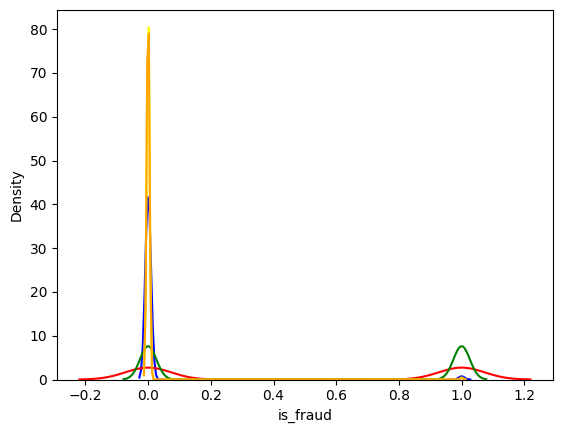

In [ ]:
sns.kdeplot(y_pred,color='blue')
sns.kdeplot(y_resampled,color='red')
sns.kdeplot(y_smote,color='green')
sns.kdeplot(y,color='yellow')
sns.kdeplot(y_test,color='orange')
plt.show()



> NEW LINE




In [ ]:
from sklearn.ensemble import RandomForestClassifier
rf=RandomForestClassifier()
rf.fit(x_resampled,y_resampled)
y_pred=rf.predict(x_test)
print(y_pred)
accuracy=accuracyscore.accuracy_score(y_test,y_pred)
print(accuracy)


[0 0 0 ... 0 1 0]
0.9752734745437892


In [ ]:
from sklearn.ensemble import RandomForestClassifier
rf=RandomForestClassifier()
rf.fit(x_smote, y_smote)
y_pred=rf.predict(x_test)
print(y_pred)
accuracy=accuracyscore.accuracy_score(y_test,y_pred)
print(accuracy)


[0 0 0 ... 0 0 0]
0.9876232412424265


In [ ]:
import sklearn.metrics as classification_report
print(classification_report.classification_report(y_test,y_pred))

              precision    recall  f1-score   support

           0       1.00      0.99      0.99    553574
           1       0.22      0.85      0.35      2145

    accuracy                           0.99    555719
   macro avg       0.61      0.92      0.67    555719
weighted avg       1.00      0.99      0.99    555719

